<a href="https://colab.research.google.com/github/mitalimishra24/Major-Project/blob/main/Major_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importing Libraries**

In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread
from skimage.transform import resize
import pandas as pd
import seaborn as sns

In [3]:
!pip install bar_chart_race

     |████████████████████████████████| 163kB 4.4MB/s 


In [4]:
import bar_chart_race as bcr 

# **Reading Dataset**

In [5]:
df = pd.read_csv('/content/COVID-19 IndiaCases.csv')

In [6]:
df.head()

,S. No.,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death
0,1,12-03-2020,India,74,71,3.0,0.0
1,2,13-03-2020,India,75,71,3.0,1.0
2,3,14-03-2020,India,84,72,10.0,2.0
3,4,15-03-2020,India,107,95,10.0,2.0
4,5,16-03-2020,India,114,99,13.0,2.0


In [7]:
df.tail()

,S. No.,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death
11003,11004,05-01-2121,World,84474195,82625491,NaN,1848704.0
11004,11005,06-01-2121,World,85091012,83230007,NaN,1861005.0
11005,11006,07-01-2121,World,85929428,84053328,NaN,1876100.0
11006,11007,10-01-2121,World,88383771,86464645,NaN,1919126.0
11007,11008,11-01-2121,World,89048345,87118080,NaN,1930265.0


In [8]:
df.columns

Index(['S. No.', 'Date', 'Region', 'Confirmed Cases', 'Active Cases',
       'Cured/Discharged', 'Death'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11008 entries, 0 to 11007
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   S. No.            11008 non-null  int64  
 1   Date              11008 non-null  object 
 2   Region            11008 non-null  object 
 3   Confirmed Cases   11008 non-null  int64  
 4   Active Cases      11008 non-null  int64  
 5   Cured/Discharged  10744 non-null  float64
 6   Death             11007 non-null  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 602.1+ KB


In [10]:
df.nunique()

S. No.              11008
Date                  304
Region                 39
Confirmed Cases      8446
Active Cases         6690
Cured/Discharged     7627
Death                3731
dtype: int64

In [11]:
df['Region'].value_counts()

Telangana                                   304
Uttar Pradesh                               304
Tamil Nadu                                  304
Kerala                                      304
Delhi                                       304
India                                       304
Maharashtra                                 304
Karnataka                                   304
Andhra Pradesh                              304
Ladakh                                      304
Rajasthan                                   304
Jammu and Kashmir                           304
Haryana                                     304
Punjab                                      304
Odisha                                      300
Uttarakhand                                 300
Puducherry                                  297
Chandigarh                                  297
West Bengal                                 297
Gujarat                                     296
Chhattisgarh                            

# **Data Preprocessing**







In [12]:
# Create a new column named Case Fatality Ratio or CFR which shows Recovery Rate
df['CFR'] = (df['Death']/(df['Death'] + df['Cured/Discharged']))*100
df

,S. No.,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death,CFR
0,1,12-03-2020,India,74,71,3.0,0.0,0.000000
1,2,13-03-2020,India,75,71,3.0,1.0,25.000000
2,3,14-03-2020,India,84,72,10.0,2.0,16.666667
3,4,15-03-2020,India,107,95,10.0,2.0,16.666667
4,5,16-03-2020,India,114,99,13.0,2.0,13.333333
...,...,...,...,...,...,...,...,...
11003,11004,05-01-2121,World,84474195,82625491,NaN,1848704.0,NaN
11004,11005,06-01-2121,World,85091012,83230007,NaN,1861005.0,NaN
11005,11006,07-01-2121,World,85929428,84053328,NaN,1876100.0,NaN
11006,11007,10-01-2121,World,88383771,86464645,NaN,1919126.0,NaN


In [13]:
df1 = df[(df.Region !='India')& (df.Region !='World') & (df.Region !='State assignment pending')]
df1

,S. No.,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death,CFR
304,305,27-03-2020,Andaman and Nicobar Islands,1,1,0.0,0.0,NaN
305,306,28-03-2020,Andaman and Nicobar Islands,6,6,0.0,0.0,NaN
306,307,29-03-2020,Andaman and Nicobar Islands,9,9,0.0,0.0,NaN
307,308,30-03-2020,Andaman and Nicobar Islands,9,9,0.0,0.0,NaN
308,309,31-03-2020,Andaman and Nicobar Islands,10,10,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...
10740,10741,08-01-2121,West Bengal,558173,8476,539816.0,9881.0,1.797536
10741,10742,09-01-2121,West Bengal,559099,8245,540952.0,9902.0,1.797572
10742,10743,10-01-2121,West Bengal,559886,8034,541930.0,9922.0,1.797946
10743,10744,11-01-2121,West Bengal,560709,7881,542887.0,9941.0,1.798208


In [14]:
df1 = df1.drop(columns='S. No.')


In [15]:
df1= df1.fillna(0)
df1

,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death,CFR
304,27-03-2020,Andaman and Nicobar Islands,1,1,0.0,0.0,0.000000
305,28-03-2020,Andaman and Nicobar Islands,6,6,0.0,0.0,0.000000
306,29-03-2020,Andaman and Nicobar Islands,9,9,0.0,0.0,0.000000
307,30-03-2020,Andaman and Nicobar Islands,9,9,0.0,0.0,0.000000
308,31-03-2020,Andaman and Nicobar Islands,10,10,0.0,0.0,0.000000
...,...,...,...,...,...,...,...
10740,08-01-2121,West Bengal,558173,8476,539816.0,9881.0,1.797536
10741,09-01-2121,West Bengal,559099,8245,540952.0,9902.0,1.797572
10742,10-01-2121,West Bengal,559886,8034,541930.0,9922.0,1.797946
10743,11-01-2121,West Bengal,560709,7881,542887.0,9941.0,1.798208




1. **Data Frame preprocessing for Active Cases for Indian States**




In [16]:
AC = df[(df.Region !='India')& (df.Region !='World') & (df.Region !='State assignment pending')]
AC.drop(columns=['S. No.','Confirmed Cases','Cured/Discharged','Death','CFR'],inplace=True)
AC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10353 entries, 304 to 10744
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Date          10353 non-null  object
 1   Region        10353 non-null  object
 2   Active Cases  10353 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 323.5+ KB


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [17]:
AC["Date"] = pd.to_datetime(AC["Date"],exact=False,dayfirst=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [18]:
AC=AC.pivot(index="Date", columns="Region", values="Active Cases")

In [19]:
AC = AC.fillna(0)
AC

Region,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli and Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Ladakh,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Meghalaya,Mizoram,Nagaland,Odisha,Puducherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-12,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,14.0,0.0,1.0,0.0,4.0,14.0,3.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0,1.0,0.0,11.0,0.0,0.0
2020-03-13,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,14.0,0.0,1.0,0.0,4.0,14.0,3.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0,1.0,0.0,11.0,0.0,0.0
2020-03-14,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,14.0,0.0,2.0,0.0,5.0,16.0,3.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,7.0,0.0,0.0
2020-03-15,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,14.0,0.0,2.0,0.0,5.0,19.0,3.0,0.0,0.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,1.0,2.0,0.0,8.0,0.0,0.0
2020-03-16,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,14.0,0.0,3.0,0.0,5.0,20.0,4.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,0.0,9.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121-01-08,32.0,2822.0,79.0,3046.0,4261.0,240.0,8859.0,5.0,4168.0,899.0,8359.0,2563.0,1220.0,2396.0,1448.0,9138.0,64639.0,215.0,0.0,8528.0,52276.0,490.0,138.0,79.0,131.0,1973.0,359.0,2975.0,7468.0,465.0,7547.0,5000.0,59.0,11787.0,3309.0,8476.0
2121-01-09,31.0,2832.0,77.0,3042.0,4075.0,238.0,9045.0,5.0,3779.0,877.0,8149.0,2501.0,1182.0,2241.0,1465.0,9448.0,64434.0,203.0,0.0,8324.0,53006.0,480.0,155.0,82.0,129.0,1972.0,343.0,3007.0,7402.0,393.0,7432.0,4822.0,60.0,11535.0,3179.0,8245.0
2121-01-10,24.0,2607.0,64.0,3019.0,4247.0,228.0,9274.0,4.0,3683.0,867.0,7968.0,2563.0,1088.0,2094.0,1494.0,9471.0,64516.0,203.0,0.0,8029.0,54129.0,515.0,163.0,98.0,113.0,1908.0,328.0,2952.0,6730.0,369.0,7304.0,4756.0,57.0,11221.0,3215.0,8034.0



2.   **Data Frame preprocessing for Confirmed Cases for Indian States**



In [20]:
CC = df[(df.Region !='India')& (df.Region !='World') & (df.Region !='State assignment pending')]
CC.drop(columns=['S. No.','Active Cases','Cured/Discharged','Death','CFR'],inplace=True)
CC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10353 entries, 304 to 10744
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Date             10353 non-null  object
 1   Region           10353 non-null  object
 2   Confirmed Cases  10353 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 323.5+ KB


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [21]:
CC["Date"] = pd.to_datetime(CC["Date"],exact=False,dayfirst=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [22]:
CC=CC.pivot(index="Date", columns="Region", values="Confirmed Cases")

In [23]:
CC = CC.fillna(0)
CC

Region,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli and Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Ladakh,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Meghalaya,Mizoram,Nagaland,Odisha,Puducherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-12,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,14.0,0.0,1.0,0.0,4.0,17.0,3.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0,1.0,0.0,11.0,0.0,0.0
2020-03-13,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,14.0,0.0,1.0,0.0,5.0,17.0,3.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0,1.0,0.0,11.0,0.0,0.0
2020-03-14,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,14.0,0.0,2.0,0.0,6.0,19.0,3.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0,1.0,0.0,12.0,0.0,0.0
2020-03-15,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,14.0,0.0,2.0,0.0,6.0,22.0,3.0,0.0,0.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,1.0,3.0,0.0,12.0,0.0,0.0
2020-03-16,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,14.0,0.0,3.0,0.0,6.0,23.0,4.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4.0,0.0,1.0,3.0,0.0,13.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121-01-08,4958.0,884171.0,16757.0,216481.0,254447.0,20147.0,286596.0,3379.0,628838.0,51626.0,249913.0,264161.0,56146.0,122176.0,116229.0,924898.0,795933.0,9600.0,0.0,246822.0,1958282.0,28531.0,13536.0,4259.0,11960.0,331151.0,38369.0,168187.0,311620.0,5965.0,823986.0,289135.0,33299.0,590844.0,92842.0,558173.0
2121-01-09,4959.0,884490.0,16764.0,216531.0,254701.0,20201.0,287556.0,3380.0,629282.0,51709.0,250598.0,264442.0,56282.0,122303.0,116436.0,925868.0,801075.0,9601.0,0.0,247436.0,1961975.0,28579.0,13560.0,4275.0,11964.0,331396.0,38389.0,168486.0,312091.0,5979.0,824776.0,289433.0,33302.0,591610.0,93111.0,559099.0
2121-01-10,4959.0,884689.0,16767.0,216565.0,255386.0,20251.0,288570.0,3380.0,629801.0,51790.0,251273.0,264721.0,56366.0,122425.0,116672.0,926767.0,806603.0,9608.0,0.0,247977.0,1965556.0,28646.0,13592.0,4292.0,11975.0,331602.0,38425.0,168734.0,312521.0,5984.0,825537.0,289784.0,33307.0,592475.0,93398.0,559886.0


3. **Data Frame preprocessing for Death Count for Indian States**

In [24]:
DC = df[(df.Region !='India')& (df.Region !='World') & (df.Region !='State assignment pending')]
DC.drop(columns=['S. No.','Active Cases','Cured/Discharged','Confirmed Cases','CFR'],inplace=True)
DC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10353 entries, 304 to 10744
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    10353 non-null  object 
 1   Region  10353 non-null  object 
 2   Death   10353 non-null  float64
dtypes: float64(1), object(2)
memory usage: 323.5+ KB


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [25]:
DC["Date"] = pd.to_datetime(DC["Date"],exact=False,dayfirst=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [26]:
DC=DC.pivot(index="Date", columns="Region", values="Death")

In [27]:
DC = DC.fillna(0)
DC

Region,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli and Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Ladakh,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Meghalaya,Mizoram,Nagaland,Odisha,Puducherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-03-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-03-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-03-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-03-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121-01-08,62.0,7126.0,56.0,1059.0,1424.0,325.0,3454.0,2.0,10644.0,744.0,4332.0,2940.0,953.0,1903.0,1041.0,12131.0,3234.0,127.0,0.0,3682.0,49897.0,364.0,141.0,8.0,82.0,1888.0,636.0,5422.0,2727.0,129.0,12200.0,1561.0,388.0,8452.0,1555.0,9881.0
2121-01-09,62.0,7127.0,56.0,1059.0,1428.0,326.0,3469.0,2.0,10654.0,744.0,4335.0,2943.0,955.0,1907.0,1043.0,12134.0,3257.0,127.0,0.0,3691.0,49970.0,364.0,143.0,8.0,83.0,1890.0,636.0,5437.0,2727.0,129.0,12208.0,1563.0,388.0,8469.0,1562.0,9902.0
2121-01-10,62.0,7128.0,56.0,1060.0,1430.0,327.0,3484.0,2.0,10666.0,746.0,4340.0,2949.0,958.0,1909.0,1045.0,12138.0,3279.0,127.0,0.0,3701.0,50027.0,365.0,143.0,8.0,84.0,1891.0,636.0,5439.0,2731.0,129.0,12215.0,1565.0,388.0,8481.0,1568.0,9922.0


## **Data Analysis and Visualisations**

In [28]:
# Which Region has the highest active cases and when
df1[df1['Active Cases']==df1['Active Cases'].max()]   

,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death,CFR
6232,18-09-2020,Maharashtra,1145840,302135,812354.0,31351.0,3.715872


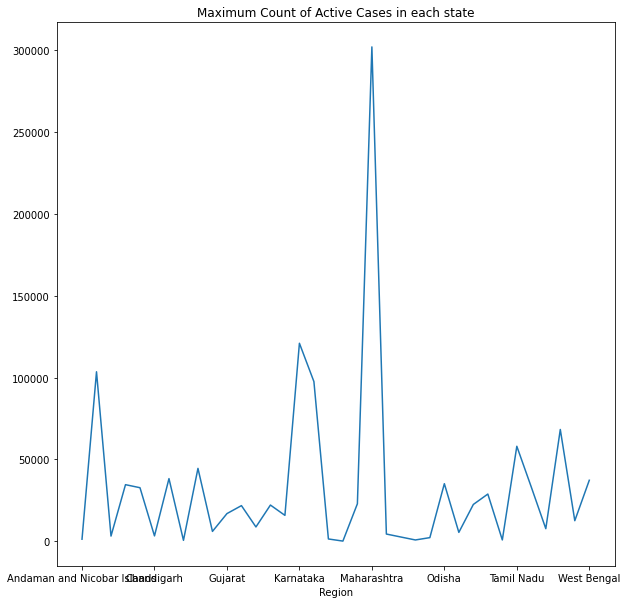

In [29]:
#Identifying max number of Active Cases in each state
g= df1.groupby("Region")["Active Cases"].max()
g.sort_values(ascending=False)
g.plot(figsize=(10,10),title="Maximum Count of Active Cases in each state")

In [30]:
# Which Region has the highest deaths and when
df1[df1['Death']==df1['Death'].max()]   

,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death,CFR
6345,12-01-2121,Maharashtra,1971552,53463,1867988.0,50101.0,2.612027


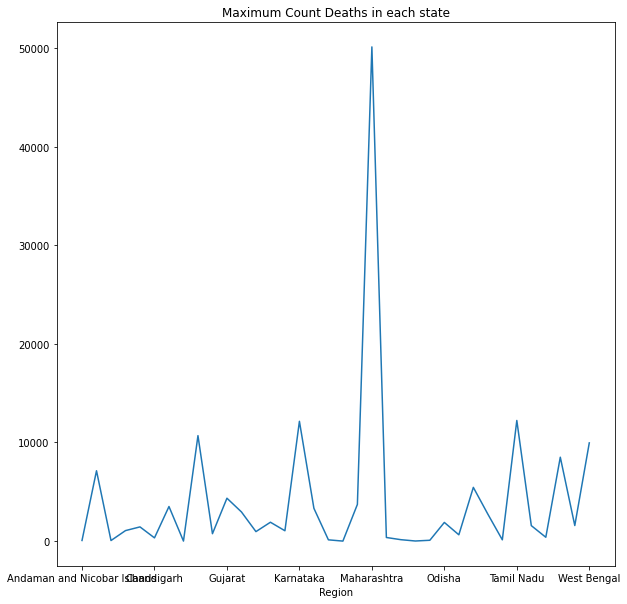

In [31]:
#Identifying max number of Deaths in each state
g= df1.groupby("Region")["Death"].max()
g.sort_values(ascending=False)
g.plot(figsize=(10,10),title="Maximum Count Deaths in each state")

In [32]:
#Identifying highest recovery rate in each state
rr =df1.groupby('Region')[["CFR"]].max()
rr.sort_values(ascending=False,by=['CFR'])


,CFR
Region,
West Bengal,100.000000
Gujarat,100.000000
Meghalaya,100.000000
Punjab,100.000000
Maharashtra,100.000000
Madhya Pradesh,100.000000
Karnataka,100.000000
Jharkhand,100.000000
Himachal Pradesh,100.000000


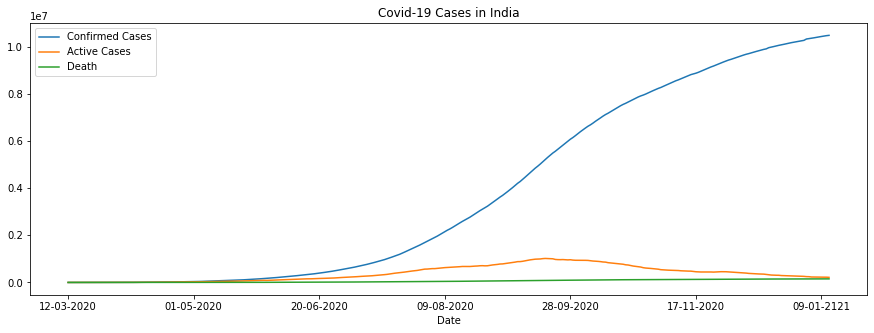

In [33]:
# Plot of Covid -19 cases in INDIA
df= df[(df.Region =='India')]
df.plot(y = ['Confirmed Cases','Active Cases','Death'],x='Date',figsize=(15,5),title="Covid-19 Cases in India")

In [ ]:
#Bar Race plot for Active Cases in each State
bcr.bar_chart_race(df=AC,n_bars = 5,filter_column_colors=True,title="Covid-19 Active Cases")

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 8.067708333333332 x 3.5 to 8.055555555555555 x 3.5
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1160x504 -pix_fmt rgba -r 20.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmp6olivew2/temp.m4v


In [ ]:
#Bar Race plot for Confirmed Cases in each State
bcr.bar_chart_race(df=CC,n_bars = 5,filter_column_colors=True,title="Covid-19 Confirmed Cases")

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 8.067708333333332 x 3.5 to 8.055555555555555 x 3.5
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1160x504 -pix_fmt rgba -r 20.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmprh3y77fm/temp.m4v


In [ ]:
#Bar Race plot for Death in each State
bcr.bar_chart_race(df=DC,n_bars = 5,filter_column_colors=True,title="Covid-19 Death Count")

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 8.067708333333332 x 3.5 to 8.055555555555555 x 3.5
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1160x504 -pix_fmt rgba -r 20.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpn2vrxsam/temp.m4v


# **Forecasting : FBProphet for Active Cases in INDIA**


In [ ]:
df_india = df[(df.Region =='India')]
df_india

,S. No.,Date,Region,Confirmed Cases,Active Cases,Cured/Discharged,Death,CFR
0,1,12-03-2020,India,74,71,3.0,0.0,0.000000
1,2,13-03-2020,India,75,71,3.0,1.0,25.000000
2,3,14-03-2020,India,84,72,10.0,2.0,16.666667
3,4,15-03-2020,India,107,95,10.0,2.0,16.666667
4,5,16-03-2020,India,114,99,13.0,2.0,13.333333
...,...,...,...,...,...,...,...,...
299,300,08-01-2121,India,10413417,225449,10037398.0,150570.0,1.477920
300,301,09-01-2121,India,10431639,224190,10056651.0,150798.0,1.477333
301,302,10-01-2121,India,10450284,223335,10075950.0,150999.0,1.476481
302,303,11-01-2121,India,10466595,222526,10092909.0,151160.0,1.475586


In [ ]:
df_india.drop(columns=['S. No.','Region','Confirmed Cases','Cured/Discharged','Death'],inplace=True)

In [ ]:
df_india.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 304 entries, 0 to 303
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          304 non-null    object 
 1   Active Cases  304 non-null    int64  
 2   CFR           304 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 9.5+ KB


In [ ]:
df_india['Date'] = pd.to_datetime(df_india['Date'],format= '%d-%m-%Y')
df_india.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 304 entries, 0 to 303
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          304 non-null    datetime64[ns]
 1   Active Cases  304 non-null    int64         
 2   CFR           304 non-null    float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 9.5 KB


In [ ]:
df_india.index = pd.PeriodIndex(df_india.Date,freq='M')
df_india.index

PeriodIndex(['2020-03', '2020-03', '2020-03', '2020-03', '2020-03', '2020-03',
             '2020-03', '2020-03', '2020-03', '2020-03',
             ...
             '2121-01', '2121-01', '2121-01', '2121-01', '2121-01', '2121-01',
             '2121-01', '2121-01', '2121-01', '2121-01'],
            dtype='period[M]', name='Date', length=304, freq='M')

In [ ]:
df_india.index.rename('DateNew',inplace=True)

In [ ]:
df_india = df_india.rename(columns = {'Date':'ds','Active Cases':'y'})
df_india

,ds,y,CFR
DateNew,,,
2020-03,2020-03-12,71,0.000000
2020-03,2020-03-13,71,25.000000
2020-03,2020-03-14,72,16.666667
2020-03,2020-03-15,95,16.666667
2020-03,2020-03-16,99,13.333333
...,...,...,...
2121-01,2121-01-08,225449,1.477920
2121-01,2121-01-09,224190,1.477333
2121-01,2121-01-10,223335,1.476481


In [ ]:
import fbprophet 
op = fbprophet.Prophet(changepoint_prior_scale=0.2)
op.fit(df_india)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
forecast = op.make_future_dataframe(periods = 30,freq='D')
forecast = op.predict(forecast)

In [ ]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'weekly', 'weekly_lower', 'weekly_upper', 'yearly', 'yearly_lower',
       'yearly_upper', 'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

In [ ]:
forecast[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2020-03-12,2675.728435,-7766.726421,10985.757533
1,2020-03-13,1682.984911,-8906.019245,10301.773690
2,2020-03-14,850.046536,-8353.087027,10637.085157
3,2020-03-15,-41.825067,-9632.848645,10255.354391
4,2020-03-16,459.996690,-8775.651234,10152.073615
...,...,...,...,...
329,2121-02-07,382182.696301,372232.053855,392620.282204
330,2121-02-08,383370.105176,373818.029963,393505.952797
331,2121-02-09,382255.704220,372027.651709,391674.301464
332,2121-02-10,380343.959384,371083.256729,390172.402921


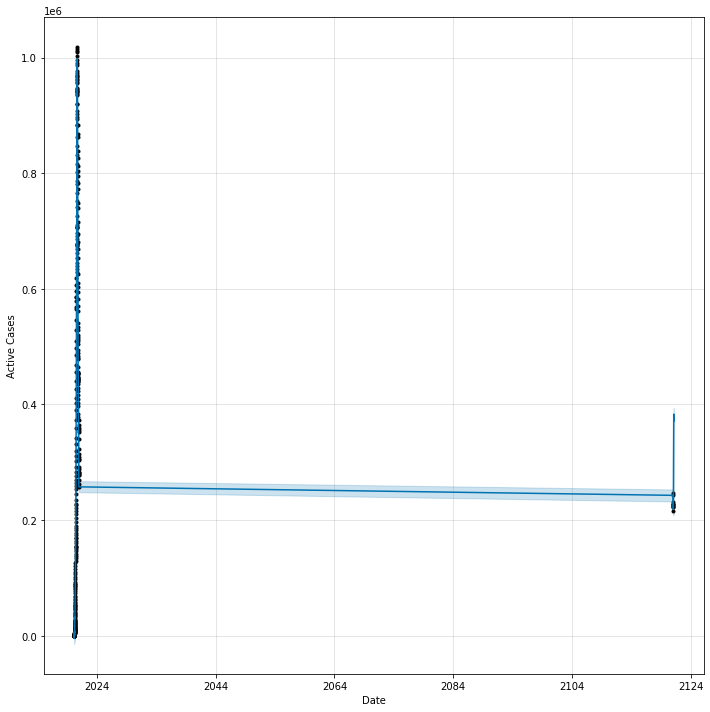

In [ ]:
op.plot(forecast,xlabel='Date',ylabel='Active Cases',figsize=(10,10));

In [ ]:
# Python
from fbprophet.plot import plot_plotly, plot_components_plotly

plot_plotly(op, forecast)

In [ ]:
# Python
plot_components_plotly(op, forecast)